**Approach:**

**Training:**

-> For every selected frame of video, extract features and give label(label generated by converting manually marked safe duration into frame intervals)

-> Use classification to predict 0/1 for each frame

**Testing :**

For every frame, extract features and use classification to predict label

**Features to be extracted from individual frames:**

1. Number of bounding boxes
2. Area covered by bounding boxes
3. Region in which bounding boxes are present (1/2/3/4)

In [1]:
#importing necessary libraries
from __future__ import print_function
import numpy as np
import cv2
import glob
from matplotlib import pyplot as plt
%matplotlib inline  
from imageai.Detection import VideoObjectDetection
import os
import sys
from random import randint
from math import ceil
import natsort
import pandas as pd
import random
from sklearn.svm import SVC 
from sklearn.metrics import classification_report, confusion_matrix 
from sklearn.model_selection import GridSearchCV 



Bad key "text.kerning_factor" on line 4 in
/home/siddhi/anaconda3/envs/roadcross/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using TensorFlow backend.


In [3]:
def find_region(x,y):

    '''
    Returns the region in which the particular point lies

    Parameters:
    x(int) : x coordinate of the point
    y(int) : y coordinate of the point

    Returns:
    int : region no (1/2/3/4)
    '''

    if(x<960 and y<540):
        return 4 #Top left
    if(x<960 and y>540):
        return 1 #Bottom left
    if(x>960 and y<540):
        return 3 #Top right
    if(x>960 and y>540):
        return 2 #Bottom right

def extract_features_from_frame(bounding_boxes, frame_no):
        
    '''
    Extract features from a particular frame

    Parameters:
    bounding_boxes(array) : detection array of the video
    frame_no(int) : frame no for which features are to be extracted

    Returns:
    list : containing 6 features of the frame
    '''

    #feature 1
    #no of vehicles in the frame
    no_of_boxes = len(bounding_boxes[frame_no])
    
    #feature 2
    #total area covered by vehicles in the frame
    area = 0
    for j in range(len(bounding_boxes[frame_no])):
        area = area + ((bounding_boxes[frame_no][j][3]-bounding_boxes[frame_no][j][1])*
                        (bounding_boxes[frame_no][j][2]-bounding_boxes[frame_no][j][0]))/1000 
                        #divide by 1000 to avoid large number
    
    #feature 3
    #number of vehicles in each region
    r1 = r2 = r3 = r4 = 0
    for j in range(len(bounding_boxes[frame_no])):
        cx = (bounding_boxes[frame_no][j][0] + bounding_boxes[frame_no][j][2])/2 #x coordinate of center of bounding box
        cy = (bounding_boxes[frame_no][j][1] + bounding_boxes[frame_no][j][3])/2 #y coordinate of center of bounding box
        if(find_region(cx,cy)==1):
            r1 = r1 + 1
        elif(find_region(cx,cy)==2):
            r2 = r2 + 1
        elif(find_region(cx,cy)==3):
            r3 = r3 + 1
        elif(find_region(cx,cy)==4):
            r4 = r4 + 1
                
    features_frame = [no_of_boxes,area,r1,r2,r3,r4]
        
    return features_frame


In [4]:
def get_labels_from_video(findex, no_frames, labels_csv):
    
    '''
    Get labels for a particular video

    Parameters:
    findex(int) :
    no_frames(int) :
    labels_csv(path) :

    Returns:
    
    '''

    labels = [0]*no_frames
    #print(findex,no_frames)
    if(np.isnan(labels_csv[findex][0])):
        return labels,-1
    else:
        j = 0
        while(j<len(labels_csv[findex]) and not(np.isnan(labels_csv[findex][j]))):
            safe_start = max(int(labels_csv[findex][j]*30)-1,0)
            safe_end = min(int(labels_csv[findex][j+1]*30)-1, no_frames-1)
            labels[safe_start:safe_end+1] = [1]*(safe_end-safe_start+1)
            j = j+2
    if len(labels) > no_frames:
        raise Exception('Check the labels assigned in CSV file!')
    return labels,1


In [5]:
def generate_dataframe(folder, findex, labels_csv):
    
    arrays = glob.glob(folder+'/array*.npy')
    arrays = natsort.natsorted(arrays)
    cols_f = ['no of vehicles','area','region1','region2','region3','region4']
    cols_l = ['safe/unsafe']
    features_dataframe = pd.DataFrame()
    labels_dataframe = pd.DataFrame()
    for fname in arrays:
        print("processing ",fname,":")
        bounding_boxes = np.load(fname, allow_pickle=True)
        no_frames = bounding_boxes.shape[0]
        print("no of frames: ", no_frames)
        labels, flag = get_labels_from_video(findex, no_frames, labels_csv)
        print('flag', flag)
        if(flag == -1):
            print('no safe time')
            findex = findex + 1
            continue
        else:
            features = []
            labels_0 = [i for i, value in enumerate(labels) if value == 0] 
            labels_1 = [i for i, value in enumerate(labels) if value == 1] 
            random.shuffle(labels_0)
            random.shuffle(labels_1)
            if(len(labels_0) >= 50): 
                labels_0 = labels_0[:50]
            if(len(labels_1) >= 50): 
                labels_1 = labels_1[:50]    
            for frame_no in labels_0:
                features_frame = extract_features_from_frame(bounding_boxes, frame_no)
                features.append(features_frame)
            for frame_no in labels_1:
                features_frame = extract_features_from_frame(bounding_boxes, frame_no)
                features.append(features_frame)
        
        no_frames_in_features = len(features)
        print("no_frames_in_features",no_frames_in_features)
        labels = [0]*len(labels_0) + [1]*len(labels_1)
        print("no_of_frames_in_labels", len(labels))
        findex = findex + 1
        df1 = pd.DataFrame(features, columns=cols_f)
        features_dataframe = features_dataframe.append(df1,ignore_index=True)
        print("df1.size",df1.shape)
        df2 = pd.DataFrame(labels, columns=cols_l)
        labels_dataframe = labels_dataframe.append(df2,ignore_index=True)
        print("df2.size",df2.shape)
        
    return features_dataframe, labels_dataframe

In [6]:
from numpy import genfromtxt

labels_train = genfromtxt('labels_train.csv', delimiter=',')
labels_test = genfromtxt('labels_test.csv', delimiter=',')
print(labels_train.shape, labels_test.shape)

(60, 4) (16, 6)


In [8]:
features_df_train, labels_df_train = generate_dataframe('/home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train',0,labels_train)
features_df_train.to_pickle('features_df_train.pkl')
labels_df_train.to_pickle('labels_df_train.pkl')

features_df_test, labels_df_test = generate_dataframe('/home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_test',0,labels_test)
features_df_test.to_pickle('features_df_test.pkl')
labels_df_test.to_pickle('labels_df_test.pkl')

processing  /home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train/array1.npy :
no of frames:  210
0 210
flag -1
no safe time
processing  /home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train/array2.npy :
no of frames:  150
1 150
flag 1
no_frames_in_features 79
no_of_frames_in_labels 79
df1.size (79, 6)
df2.size (79, 1)
processing  /home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train/array3.npy :
no of frames:  180
2 180
flag 1
no_frames_in_features 100
no_of_frames_in_labels 100
df1.size (100, 6)
df2.size (100, 1)
processing  /home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train/array4.npy :
no of frames:  150
3 150
flag -1
no safe time
processing  /home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train/array5.npy :
no of frames:  240
4 240
flag -1
no safe time
processing  /home/siddhi/Desktop/road_crossing_dataset_extra/arrays_detection_train/array6.npy :
no of frames:  210
5 210
flag -1
no safe t

In [9]:
features_df_train = pd.read_pickle("features_df_train.pkl")
features_df_test = pd.read_pickle("features_df_test.pkl")
labels_df_train = pd.read_pickle("labels_df_train.pkl")
labels_df_test = pd.read_pickle("labels_df_test.pkl")

In [10]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
features_train_scaled = pd.DataFrame(sc.fit_transform(features_df_train))
features_train_scaled.columns = ['no of vehicles','area','region1','region2','region3','region4']
features_test_scaled = pd.DataFrame(sc.transform(features_df_test))
features_test_scaled.columns = ['no of vehicles','area','region1','region2','region3','region4']

In [14]:
model = SVC() 
model.fit(features_train_scaled, labels_df_train) 
from sklearn.metrics import accuracy_score
 
# print prediction results 
print("for train data:")
predictions = model.predict(features_train_scaled) 
print(classification_report(labels_df_train, predictions)) 
print("accuracy score", accuracy_score(labels_df_train, predictions))

print("\nfor test data:")
predictions = model.predict(features_test_scaled) 
print(classification_report(labels_df_test, predictions)) 
print("accuracy score",accuracy_score(labels_df_test, predictions))


for train data:
              precision    recall  f1-score   support

           0       0.64      0.65      0.65      1758
           1       0.65      0.65      0.65      1781

   micro avg       0.65      0.65      0.65      3539
   macro avg       0.65      0.65      0.65      3539
weighted avg       0.65      0.65      0.65      3539

accuracy score 0.6482057078270698

for test data:
              precision    recall  f1-score   support

           0       0.51      0.41      0.45       479
           1       0.56      0.66      0.61       550

   micro avg       0.54      0.54      0.54      1029
   macro avg       0.54      0.53      0.53      1029
weighted avg       0.54      0.54      0.54      1029

accuracy score 0.543245869776482


In [15]:
model = SVC() 
model.fit(features_df_train, labels_df_train) 
from sklearn.metrics import accuracy_score
 
# print prediction results 
print("for train data:")
predictions = model.predict(features_df_train) 
print(classification_report(labels_df_train, predictions)) 
print("accuracy score", accuracy_score(labels_df_train, predictions))

print("\nfor test data:")
predictions = model.predict(features_df_test) 
print(classification_report(labels_df_test, predictions)) 
print("accuracy score",accuracy_score(labels_df_test, predictions))

for train data:
              precision    recall  f1-score   support

           0       0.81      0.82      0.81      1758
           1       0.82      0.81      0.81      1781

   micro avg       0.81      0.81      0.81      3539
   macro avg       0.81      0.81      0.81      3539
weighted avg       0.81      0.81      0.81      3539

accuracy score 0.8132240745973439

for test data:
              precision    recall  f1-score   support

           0       0.50      0.65      0.56       479
           1       0.59      0.44      0.50       550

   micro avg       0.53      0.53      0.53      1029
   macro avg       0.54      0.54      0.53      1029
weighted avg       0.55      0.53      0.53      1029

accuracy score 0.5344995140913509


In [20]:
f1 = features_train_scaled.copy()
f1['label'] = labels_df_train['safe/unsafe'].values


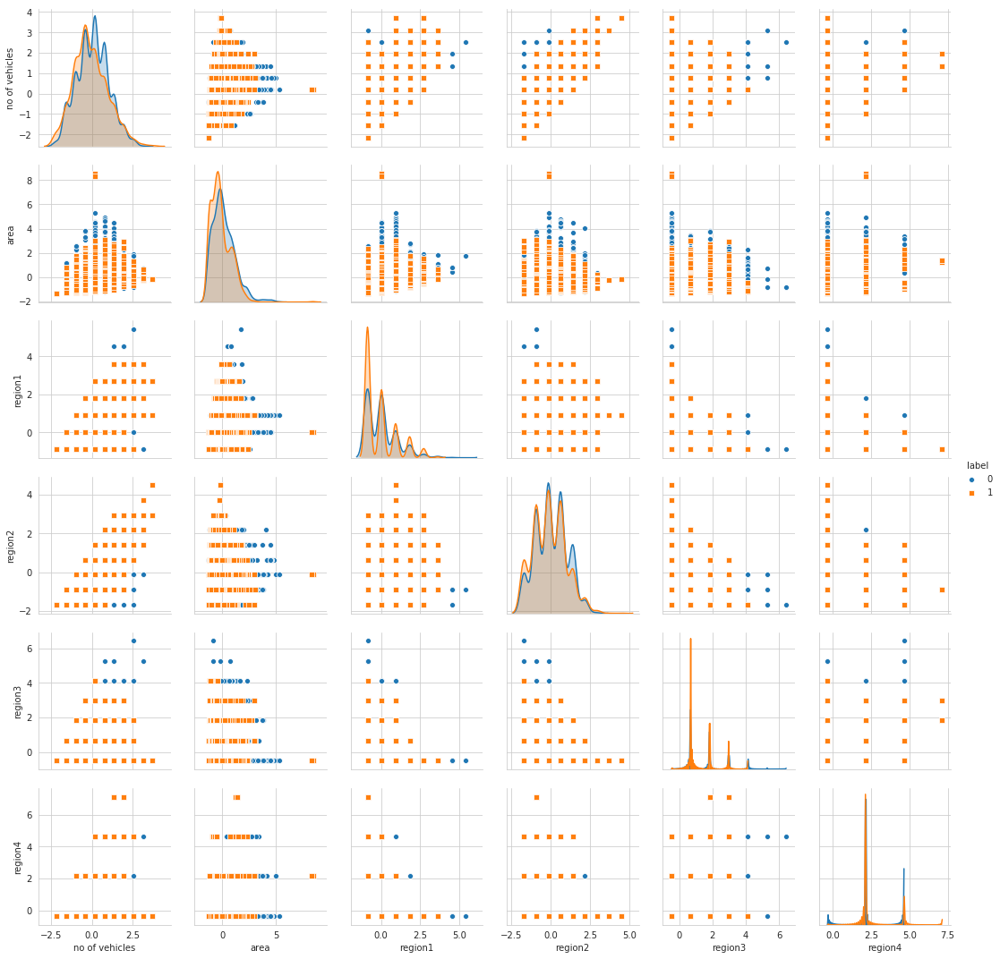

In [22]:
import seaborn as sns
sns.set_style("whitegrid");
sns.pairplot(f1, hue='label',vars = ['no of vehicles','area','region1','region2','region3','region4'], markers=["o", "s"])
plt.show()